In [1]:
# Import libraries
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # For Data Augmentation
from tensorflow.keras.layers import BatchNormalization  # For Normalization
import cv2  # OpenCV for image processing (e.g., Laplacian filtering)
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping  # For model checkpoints and early stopping
import seaborn as sns  # For advanced visualizations


In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import models, layers, optimizers, callbacks
from sklearn.model_selection import train_test_split
import logging
import albumentations as A  # For data augmentation
from scipy.ndimage import laplace  # For Laplacian filtering

# Set up logging for better monitoring and debugging
logging.basicConfig(level=logging.INFO, format='%(levelname)s: %(message)s')

# Set a random seed for reproducibility
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)
os.environ['PYTHONHASHSEED'] = str(SEED)

# Function to check GPU availability and set memory growth
def setup_environment():
    logging.info(f"TensorFlow version: {tf.__version__}")
    
    gpus = tf.config.list_physical_devices('GPU')
    if gpus:
        logging.info(f"GPUs detected: {len(gpus)}")
        for gpu in gpus:
            logging.info(f" - {gpu}")
            try:
                tf.config.experimental.set_memory_growth(gpu, True)
                logging.info(f"Memory growth set for {gpu}")
            except RuntimeError as e:
                logging.error(f"Memory growth setting failed for {gpu}: {e}")
    else:
        logging.warning("No GPU detected, using CPU...")

setup_environment()

# Configuration parameters for the model
BATCH_SIZE = 16  # Consider experimenting with this value
EPOCHS = 100  # Reduced to avoid overfitting; EarlyStopping will be used
LEARNING_RATE = 0.001
IMAGE_SIZE = (224, 224)  # Consider varying this based on your dataset

# Implement Early Stopping to prevent overfitting
early_stopping = callbacks.EarlyStopping(
    monitor='val_loss',  # Monitor validation loss
    patience=10,  # Stop after 10 epochs of no improvement
    restore_best_weights=True  # Restore the best model's weights
)

# Implement Learning Rate Scheduler
lr_scheduler = callbacks.ReduceLROnPlateau(
    monitor='val_loss',  # Reduce LR if validation loss plateaus
    factor=0.5,  # Reduce LR by half
    patience=5,  # Wait for 5 epochs before reducing
    min_lr=1e-6  # Set a lower bound for the learning rate
)

# Data augmentation pipeline using albumentations
augmentation_pipeline = A.Compose([
    A.RandomResizedCrop(size=IMAGE_SIZE, scale=(0.8, 1.0)),  # Fixed to use 'size' instead of 'height' and 'width'
    A.HorizontalFlip(),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2),
    A.Rotate(limit=30),
    A.CLAHE(clip_limit=2.0, tile_grid_size=(8, 8)),  # Contrast Limited Adaptive Histogram Equalization
    A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20)
])

# Function to apply Laplacian filtering to images
def apply_laplacian_filter(image):
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # Convert to grayscale for Laplacian
    laplacian = laplace(image_gray)
    return laplacian

# Function to normalize images
def normalize_image(image):
    return image / 255.0  # Normalization to [0, 1]

# Function to log configurations
def log_configurations():
    logging.info("Model Configuration:")
    logging.info(f"BATCH_SIZE: {BATCH_SIZE}")
    logging.info(f"IMAGE_SIZE: {IMAGE_SIZE}")
    logging.info(f"EPOCHS: {EPOCHS}")
    logging.info(f"LEARNING_RATE: {LEARNING_RATE}")

log_configurations()


INFO: TensorFlow version: 2.18.0
INFO: Model Configuration:
INFO: BATCH_SIZE: 16
INFO: IMAGE_SIZE: (224, 224)
INFO: EPOCHS: 100
INFO: LEARNING_RATE: 0.001


In [3]:
import logging

# Set up logging configuration
logging.basicConfig(level=logging.INFO, format='%(levelname)s: %(message)s')

class Hyperparameters:
    DEFAULT_IMAGE_SIZE = 224  # Can be adjusted globally if needed
    DEFAULT_BATCH_SIZE = 16
    DEFAULT_CHANNELS = 3
    DEFAULT_LEARNING_RATE = 0.001

    VALID_IMAGE_SIZES = [128, 256, 512]
    VALID_BATCH_SIZES = [16, 32, 64]  # Added a list of valid batch sizes
    VALID_CHANNELS = [1, 3]

    def __init__(self, image_size: int = None, batch_size: int = None, channels: int = None, learning_rate: float = None):
        self.image_size = image_size or self.DEFAULT_IMAGE_SIZE
        self.batch_size = batch_size or self.DEFAULT_BATCH_SIZE
        self.channels = channels or self.DEFAULT_CHANNELS
        self.learning_rate = learning_rate or self.DEFAULT_LEARNING_RATE
        self.validate_hyperparameters()

    def validate_hyperparameters(self):
        """Validate and log hyperparameters."""
        if self.image_size not in self.VALID_IMAGE_SIZES:
            logging.warning(f"IMAGE_SIZE {self.image_size} is unusual; consider using {self.VALID_IMAGE_SIZES} for optimal performance.")
        
        if self.batch_size not in self.VALID_BATCH_SIZES:
            logging.warning(f"BATCH_SIZE {self.batch_size} is unusual; consider using {self.VALID_BATCH_SIZES} for optimal performance.")

        if self.batch_size <= 0:
            raise ValueError("BATCH_SIZE must be positive.")
        
        if self.channels not in self.VALID_CHANNELS:
            raise ValueError("CHANNELS should be 1 for grayscale or 3 for RGB.")

        logging.info(f"Set IMAGE_SIZE: {self.image_size}, BATCH_SIZE: {self.batch_size}, CHANNELS: {self.channels}, LEARNING_RATE: {self.learning_rate}")
    
    def update_hyperparameters(self, image_size: int = None, batch_size: int = None, channels: int = None, learning_rate: float = None):
        """Update hyperparameters dynamically."""
        if image_size is not None:
            self.image_size = image_size
            logging.info(f"Updated IMAGE_SIZE to: {self.image_size}")
        if batch_size is not None:
            self.batch_size = batch_size
            logging.info(f"Updated BATCH_SIZE to: {self.batch_size}")
        if channels is not None:
            self.channels = channels
            logging.info(f"Updated CHANNELS to: {self.channels}")
        if learning_rate is not None:
            self.learning_rate = learning_rate
            logging.info(f"Updated LEARNING_RATE to: {self.learning_rate}")
        self.validate_hyperparameters()
    
    def display_hyperparameters(self, on_training_start=False):
        """Display current hyperparameters. Optionally trigger only during training setup."""
        if on_training_start:  # Only display when training starts
            logging.info(f"Current Hyperparameters - IMAGE_SIZE: {self.image_size}, BATCH_SIZE: {self.batch_size}, CHANNELS: {self.channels}, LEARNING_RATE: {self.learning_rate}")

# Example usage: Initialize with custom values or defaults
hyperparams = Hyperparameters(image_size=256, batch_size=32, learning_rate=0.001)

# Display hyperparameters just before starting training
hyperparams.display_hyperparameters(on_training_start=True)


INFO: Set IMAGE_SIZE: 256, BATCH_SIZE: 32, CHANNELS: 3, LEARNING_RATE: 0.001
INFO: Current Hyperparameters - IMAGE_SIZE: 256, BATCH_SIZE: 32, CHANNELS: 3, LEARNING_RATE: 0.001


In [4]:
import logging
import tensorflow as tf
from tensorflow.keras import layers

# Set up logging configuration
logging.basicConfig(level=logging.INFO, format='%(levelname)s: %(message)s')

# Dataset path
dataset_path = 'Dataset'

# Function to load and split dataset with enhanced error handling and optimizations
def load_datasets(dataset_path: str, image_size=(256, 256), batch_size=32, seed=42):
    try:
        logging.info("Loading dataset from: %s", dataset_path)

        # Data augmentation layer
        data_augmentation = tf.keras.Sequential([
            layers.RandomFlip("horizontal_and_vertical"),
            layers.RandomRotation(0.2),
            layers.RandomZoom(0.1),
        ])

        train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
            dataset_path,
            shuffle=True,
            image_size=image_size,
            batch_size=batch_size,
            validation_split=0.2,
            seed=seed,
            color_mode='rgb',  # Set according to your image channels
            subset='training'
        ).map(lambda x, y: (data_augmentation(x, training=True), y))  # Apply data augmentation

        validation_dataset = tf.keras.preprocessing.image_dataset_from_directory(
            dataset_path,
            shuffle=True,
            image_size=image_size,
            batch_size=batch_size,
            validation_split=0.2,
            seed=seed,
            color_mode='rgb',  # Set according to your image channels
            subset='validation'
        )

        # Prefetch the datasets for performance improvement
        train_dataset = train_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
        validation_dataset = validation_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

        logging.info("Datasets loaded successfully.")
        return train_dataset, validation_dataset
    
    except Exception as e:
        logging.error("Error loading dataset: %s", e)  # Fixed the string literal
        raise

# Example usage
train_dataset, validation_dataset = load_datasets(dataset_path)


INFO: Loading dataset from: Dataset


Found 2895 files belonging to 3 classes.
Using 2316 files for training.
Found 2895 files belonging to 3 classes.
Using 579 files for validation.


INFO: Datasets loaded successfully.


INFO: Loading training dataset...


Found 2895 files belonging to 3 classes.
Using 2316 files for training.


INFO: Loaded 73 batches of training dataset.
INFO: Loading validation dataset...


Found 2895 files belonging to 3 classes.
Using 579 files for validation.


INFO: Loaded 19 batches of validation dataset.
INFO: Class names: ['Healthly', 'Powdery Mildew', 'Tomato Spotted Wilt Virus']


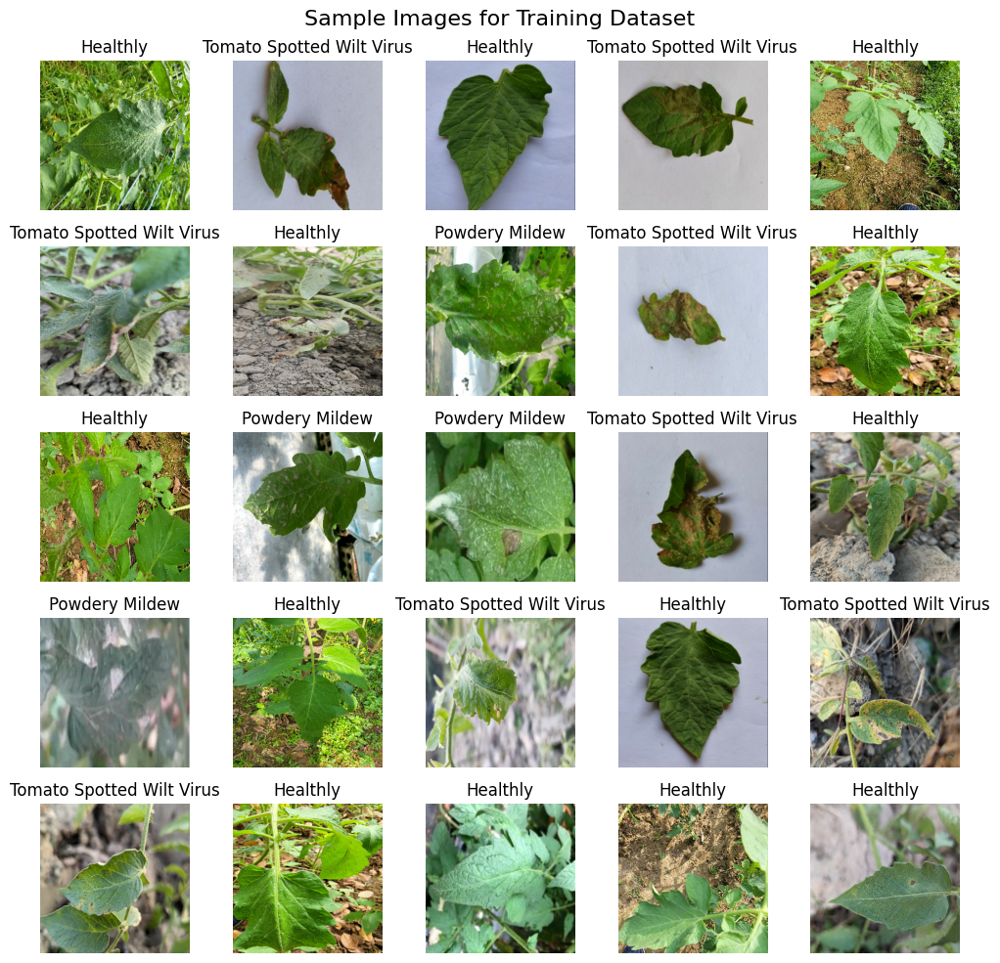

INFO: Dataset loading and preprocessing completed successfully.


In [5]:
import os
import logging
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

# Set up logging configuration
logging.basicConfig(level=logging.INFO, format='%(levelname)s: %(message)s')

# Dataset path
dataset_path = 'Dataset'

def check_directory_exists(dataset_path):
    """Check if dataset directory exists."""
    if not os.path.exists(dataset_path):
        logging.error(f"Dataset path does not exist: {dataset_path}")
        raise FileNotFoundError(f"Dataset path not found: {dataset_path}")

def load_dataset(dataset_path: str, image_size=(256, 256), batch_size=32, subset="training", seed=42):
    """Load dataset from directory with specified parameters."""
    try:
        check_directory_exists(dataset_path)
        logging.info(f"Loading {subset} dataset...")
        dataset = tf.keras.preprocessing.image_dataset_from_directory(
            dataset_path,
            shuffle=True,
            image_size=image_size,
            batch_size=batch_size,
            validation_split=0.2,
            subset=subset,
            seed=seed
        )
        logging.info(f"Loaded {len(dataset)} batches of {subset} dataset.")
        return dataset
    except Exception as e:
        logging.error(f"Error loading {subset} dataset: {e}")
        raise

# Hyperparameters
image_size = 256
batch_size = 32
SEED = None  # Set to None for true randomization

# Load and preprocess datasets
train_dataset = load_dataset(
    dataset_path,
    image_size=(image_size, image_size),
    batch_size=batch_size,
    subset="training",
    seed=42
)
validation_dataset = load_dataset(
    dataset_path,
    image_size=(image_size, image_size),
    batch_size=batch_size,
    subset="validation",
    seed=42
)

# Extract class names from the training dataset
class_names = train_dataset.class_names
logging.info(f"Class names: {class_names}")

# Normalize pixel values to [0, 1] range for both datasets
def normalize(image, label):
    """Normalize image pixel values."""
    image = tf.cast(image, tf.float32) / 255.0
    return image, label

# Apply normalization but avoid caching during visualization
normalized_train_dataset = train_dataset.map(normalize, num_parallel_calls=tf.data.AUTOTUNE)
normalized_train_dataset = normalized_train_dataset.shuffle(buffer_size=1000, reshuffle_each_iteration=True)
normalized_train_dataset = normalized_train_dataset.prefetch(tf.data.AUTOTUNE)

# Function to visualize truly random sample images with class labels
def plot_random_sample_images(dataset, class_names, num_images=25):
    """Visualize truly random sample images for the dataset."""
    plt.figure(figsize=(10, 10))
    grid_size = int(np.ceil(np.sqrt(num_images)))  # Compute grid size for 25 images

    # Gather random images by iterating through the shuffled dataset
    random_images, random_labels = [], []
    for images, labels in dataset.take(1):  # Take one batch
        random_images.extend(images.numpy())
        random_labels.extend(labels.numpy())
    
    # Display exactly 25 random images
    random_images = random_images[:num_images]
    random_labels = random_labels[:num_images]
    
    for i in range(num_images):
        ax = plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(random_images[i])
        plt.title(class_names[int(random_labels[i])])
        plt.axis("off")

    plt.suptitle("Sample Images for Training Dataset", fontsize=16)
    plt.tight_layout()
    plt.show()

# Visualize random sample images
plot_random_sample_images(normalized_train_dataset, class_names, num_images=25)

# Log completion of dataset preparation
logging.info("Dataset loading and preprocessing completed successfully.")


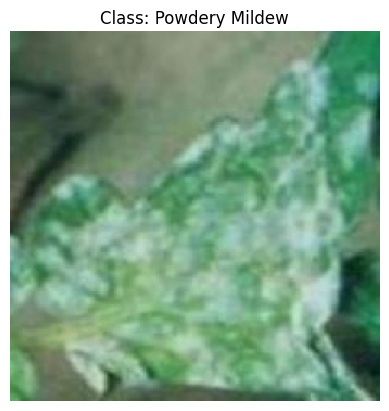

In [6]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import random
import os

# Set the dataset path
dataset_path = "C:\\Users\\sakib\\Downloads\\CNN_Model_V2\\Dataset"

# Function to load images from a specified path and visualize one at random
def visualize_random_image_from_path(dataset_path):
    # Get all class subfolders (each subfolder represents a class)
    class_subfolders = [os.path.join(dataset_path, subfolder) for subfolder in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, subfolder))]
    
    # Ensure there are class subfolders available
    if not class_subfolders:
        print("No class folders found in the dataset path.")
        return
    
    # Select a random class and a random image from that class
    random_class_folder = random.choice(class_subfolders)
    image_files = [os.path.join(random_class_folder, img) for img in os.listdir(random_class_folder) if img.endswith(('.png', '.jpg', '.jpeg'))]
    
    # Ensure there are image files in the class folder
    if not image_files:
        print(f"No images found in the selected class folder: {random_class_folder}")
        return
    
    random_image_path = random.choice(image_files)
    
    try:
        image = tf.keras.preprocessing.image.load_img(random_image_path, target_size=(256, 256))
        image_array = tf.keras.preprocessing.image.img_to_array(image)
        image_array = np.clip(image_array, 0, 255).astype('uint8')

        # Display the image
        plt.imshow(image_array)
        plt.title(f"Class: {os.path.basename(random_class_folder)}")
        plt.axis("off")
        plt.show()
    
    except Exception as e:
        print(f"Error loading image {random_image_path}: {e}")

# Visualize a random image
visualize_random_image_from_path(dataset_path)


Found 2895 files belonging to 3 classes.


INFO: Class names found: ['Healthly', 'Powdery Mildew', 'Tomato Spotted Wilt Virus']


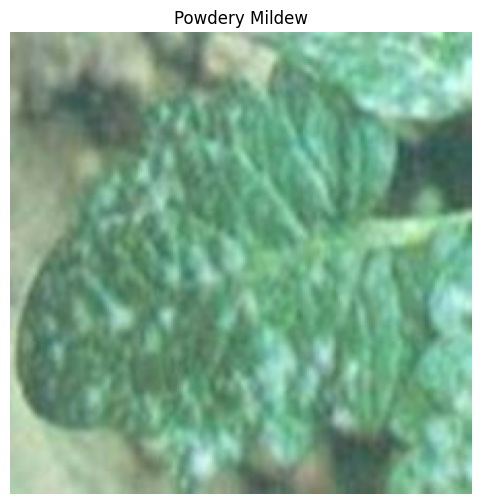

INFO: Displayed random image with class 'Powdery Mildew'


In [7]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import random
import logging

# Function to load dataset and ensure correct structure
def load_dataset(dataset_path):
    dataset = tf.keras.preprocessing.image_dataset_from_directory(
        dataset_path,
        image_size=(224, 224),  # Match to your model's expected input
        batch_size=16,
        seed=123
    )
    return dataset

# Visualization function
def visualize_random_image_from_batch(dataset, class_names, figsize=(6, 6)):
    """Visualize a random image from a batch in the dataset with proper scaling and RGB handling."""
    plt.figure(figsize=figsize)
    try:
        for image_batch, label_batch in dataset.take(1):
            # Ensure that the batch contains images
            if image_batch.shape[0] == 0:
                logging.error("Empty image batch.")
                return

            # Select a random image from the batch
            image_index = random.randint(0, image_batch.shape[0] - 1)
            
            # Convert image to numpy array and ensure range is correct
            image = image_batch[image_index].numpy()
            if image.max() <= 1.0:  # Check if it's scaled [0, 1]
                image = (image * 255).astype("uint8")
            else:
                image = np.clip(image, 0, 255).astype("uint8")
            
            # Ensure RGB format for display
            if image.shape[-1] == 1:  # Grayscale check
                image = np.repeat(image, 3, axis=-1)

            plt.imshow(image)
            plt.title(class_names[int(label_batch[image_index].numpy())], fontsize=12)
            plt.axis("off")
            plt.show()

            logging.info(f"Displayed random image with class '{class_names[int(label_batch[image_index].numpy())]}'")

    except Exception as e:
        logging.error(f"Error visualizing image: {e}")

# Example usage
dataset_path = "C:\\Users\\sakib\\Downloads\\CNN_Model_V2\\Dataset"
train_dataset = load_dataset(dataset_path)

# Dynamically fetch class names from the dataset
class_names = train_dataset.class_names
logging.info(f"Class names found: {class_names}")

# Visualize a random image from the batch
visualize_random_image_from_batch(train_dataset, class_names)


In [8]:
import logging
import tensorflow as tf

# Configure logging
logging.basicConfig(level=logging.INFO)

def get_dataset_partitions_tf(
    ds: tf.data.Dataset, 
    train_split: float = 0.8, 
    val_split: float = 0.1, 
    test_split: float = 0.1, 
    shuffle: bool = True, 
    shuffle_size: int = 10000, 
    shuffle_seed: int = 12
) -> tuple[tf.data.Dataset, tf.data.Dataset, tf.data.Dataset]:
    """Partition a TensorFlow dataset into training, validation, and test sets.

    Args:
        ds: The input dataset.
        train_split: Proportion of the dataset to be used for training.
        val_split: Proportion of the dataset to be used for validation.
        test_split: Proportion of the dataset to be used for testing.
        shuffle: Boolean indicating whether to shuffle the dataset.
        shuffle_size: Size of the buffer for shuffling.
        shuffle_seed: Seed for reproducibility in shuffling.

    Returns:
        A tuple of three datasets: (train_ds, val_ds, test_ds).
    """
    # Validate the split ratios
    total_split = train_split + val_split + test_split
    if total_split != 1.0:
        raise ValueError("Train, validation, and test splits must sum to 1.0.")
    if any(x < 0 for x in [train_split, val_split, test_split]):
        raise ValueError("Split ratios must be non-negative.")

    ds_size = tf.data.experimental.cardinality(ds).numpy()
    
    if ds_size == 0:
        raise ValueError("Dataset is empty. Please provide a valid dataset.")

    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=shuffle_seed)
        logging.info("Dataset shuffled with buffer size: %d and seed: %d.", shuffle_size, shuffle_seed)

    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)

    if train_size <= 0 or val_size <= 0 or (ds_size - train_size - val_size) <= 0:
        raise ValueError("One of the splits is too small. Please adjust the split ratios.")

    train_ds = ds.take(train_size)
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size + val_size)

    logging.info(f"Dataset sizes - Train: {train_size}, Validation: {val_size}, Test: {ds_size - train_size - val_size} (Total: {ds_size})")
    
    return train_ds, val_ds, test_ds

# Function to normalize images to the range [0, 1]
def normalize_image(image, label):
    """Normalize the image to the range [0, 1]"""
    image = tf.cast(image, tf.float32)  # Convert the image to float32
    image = image / 255.0  # Normalize the image to [0, 1]
    return image, label

# Example of loading and normalizing dataset
dataset_path = "C:\\Users\\sakib\\Downloads\\CNN_Model_V2\\Dataset"
train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_path,
    image_size=(224, 224),  # Resize images to 224x224 to match the input shape of the model
    batch_size=16,
    seed=123
)

# Dynamically fetch class names from the original dataset
class_names = train_dataset.class_names
logging.info(f"Class names found: {class_names}")

# Apply normalization to the dataset
train_dataset = train_dataset.map(normalize_image)

# Split the dataset into train, validation, and test datasets
train_ds, val_ds, test_ds = get_dataset_partitions_tf(train_dataset, train_split=0.8, val_split=0.1, test_split=0.1)


Found 2895 files belonging to 3 classes.


INFO: Class names found: ['Healthly', 'Powdery Mildew', 'Tomato Spotted Wilt Virus']
INFO: Dataset shuffled with buffer size: 10000 and seed: 12.
INFO: Dataset sizes - Train: 144, Validation: 18, Test: 19 (Total: 181)


In [9]:
import cv2
import os
import numpy as np

# Define the dataset path
dataset_dir = r'C:\Users\sakib\Downloads\CNN_Model_V2\Dataset'

# Function to apply Laplacian Filtering on an image
def apply_laplacian_filter(image_path):
    image = cv2.imread(image_path)
    # Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Apply Laplacian filter
    laplacian_image = cv2.Laplacian(gray_image, cv2.CV_64F)
    # Convert the result back to uint8 format
    laplacian_image = cv2.convertScaleAbs(laplacian_image)
    return laplacian_image

# Function to process and save Laplacian filtered images
def process_images_in_directory(directory, output_directory):
    if not os.path.exists(output_directory):
        os.makedirs(output_directory)
    
    for class_name in os.listdir(directory):
        class_path = os.path.join(directory, class_name)
        if os.path.isdir(class_path):
            output_class_path = os.path.join(output_directory, class_name)
            if not os.path.exists(output_class_path):
                os.makedirs(output_class_path)

            for image_name in os.listdir(class_path):
                if image_name.endswith('.jpg') or image_name.endswith('.png'):
                    image_path = os.path.join(class_path, image_name)
                    laplacian_image = apply_laplacian_filter(image_path)

                    # Save the filtered image
                    output_image_path = os.path.join(output_class_path, image_name)
                    cv2.imwrite(output_image_path, laplacian_image)

# Apply Laplacian filtering on the full dataset
output_dir = r'C:\Users\sakib\Downloads\CNN_Model_V2\Dataset_laplacian'

process_images_in_directory(dataset_dir, output_dir)

print("Laplacian filtering applied and images saved.")


Laplacian filtering applied and images saved.


In [10]:
import tensorflow as tf
from tensorflow.keras import layers, regularizers
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
import numpy as np
import logging

# Define constants
IMAGE_SIZE = (224, 224)
BATCH_SIZE = 16
SEED = 123

# Data augmentation
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.3),
    layers.RandomZoom(0.3),
    layers.RandomBrightness(0.2),
    layers.RandomContrast(0.2),
    layers.RandomTranslation(0.1, 0.1),  # Small shifts in the image
])

def create_advanced_hybrid_model(input_shape, num_classes):
    """Creates an advanced hybrid model combining CNN layers with MobileNetV2."""
    # MobileNetV2 as the base model
    base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False  # Freeze the base model initially

    # Custom CNN layers on top of MobileNetV2
    model = tf.keras.Sequential([
        layers.Input(shape=input_shape),
        data_augmentation,
        
        # Use preprocess_input in a Lambda layer
        layers.Lambda(preprocess_input),  # Apply preprocessing here

        base_model,  # Pre-trained MobileNetV2 as the base model
        
        # Custom CNN layers with strided convolutions for downsampling
        layers.Conv2D(128, (3, 3), strides=2, activation='relu', padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),

        layers.Conv2D(256, (3, 3), strides=2, activation='relu', padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),

        layers.Conv2D(512, (3, 3), strides=2, activation='relu', padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        
        # Global Average Pooling
        layers.GlobalAveragePooling2D(),
        
        # Fully connected layers with increased complexity
        layers.Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.01)),  # Increased units for better feature learning
        layers.Dropout(0.5),  # Dropout for regularization
        layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.01)),  # Additional dense layer
        layers.Dropout(0.4),
        layers.Dense(num_classes, activation='softmax')  # Final classification layer
    ])

    # Compile the model without label smoothing
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00005),
                  loss=tf.keras.losses.SparseCategoricalCrossentropy(),  # Removed label_smoothing
                  metrics=['accuracy'])
    
    logging.info("Advanced Hybrid CNN-MobileNetV2 model created.")
    return model

def unfreeze_base_model(model, freeze_until_layer=100):
    """Unfreeze the MobileNetV2 layers gradually."""
    base_model = model.layers[2]  # MobileNetV2 is now the third layer (index 2)
    for layer in base_model.layers[:freeze_until_layer]:
        layer.trainable = False
    for layer in base_model.layers[freeze_until_layer:]:
        layer.trainable = True
    
    # Recompile the model after unfreezing layers
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001),  # Lower LR after unfreezing
                  loss=tf.keras.losses.SparseCategoricalCrossentropy(), 
                  metrics=['accuracy'])
    logging.info(f"Unfreezing layers from {freeze_until_layer} onwards.")

# Create the improved hybrid model
input_shape = (IMAGE_SIZE[0], IMAGE_SIZE[1], 3)
num_classes = 3  # Example number of classes, adjust as needed

advanced_hybrid_model = create_advanced_hybrid_model(input_shape, num_classes)

# Log model summary
logging.info("Advanced Hybrid Model Summary:")
advanced_hybrid_model.summary()

# Set up callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
lr_schedule = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)
model_checkpoint = ModelCheckpoint('best_mobilenetv2_model.keras', monitor='val_loss', save_best_only=True)  # Changed to .keras extension

# (Cyclic Learning Rate)
def clr_schedule(epoch):
    base_lr = 0.00001
    max_lr = 0.0001
    step_size = 10
    cycle = np.floor(1 + epoch / (2 * step_size))
    x = np.abs(epoch / step_size - 2 * cycle + 1)
    lr = base_lr + (max_lr - base_lr) * max(0, (1 - x))
    return lr

clr_callback = tf.keras.callbacks.LearningRateScheduler(clr_schedule)



INFO: Advanced Hybrid CNN-MobileNetV2 model created.
INFO: Advanced Hybrid Model Summary:


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential_1 (Sequential)            │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lambda (Lambda)                      │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 4, 4, 128)           │       1,474,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 4, 4, 128)           │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 2, 2, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 2, 2, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 1, 1, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 1, 1, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │         262,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 3)                   │             771 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,606,339 (21.39 MB)

 Trainable params: 3,346,563 (12.77 MB)

 Non-trainable params: 2,259,776 (8.62 MB)

Found 2895 files belonging to 3 classes.


INFO: Class names: ['Healthly', 'Powdery Mildew', 'Tomato Spotted Wilt Virus']


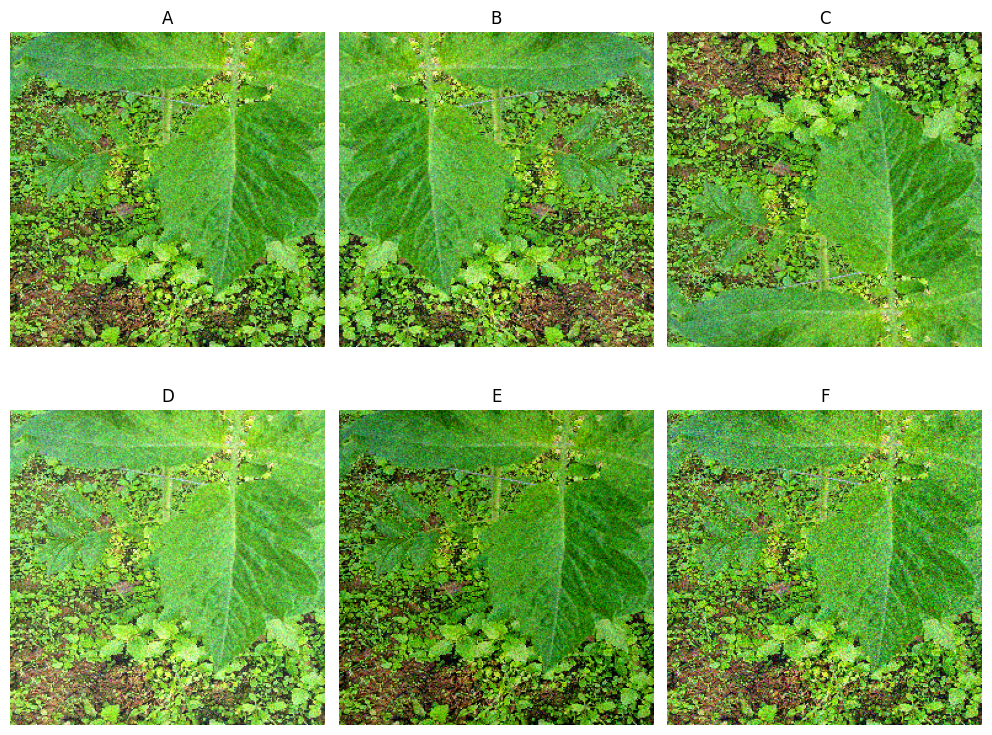

In [15]:
import tensorflow as tf
import logging
import matplotlib.pyplot as plt
import numpy as np

# Set up logging
logging.basicConfig(level=logging.INFO)

# Define the resize and rescale function
def resize_and_rescale(image, image_size=(256, 256)):
    """Resize and rescale the image."""
    image = tf.image.resize(image, image_size)
    image = image / 255.0  # Rescale image from [0, 255] to [0, 1]
    return image

# Function to add Gaussian noise to an image
def add_gaussian_noise(image, mean=0.0, stddev=0.1):
    """Add Gaussian noise to the image."""
    noise = tf.random.normal(shape=tf.shape(image), mean=mean, stddev=stddev)
    noisy_image = image + noise
    noisy_image = tf.clip_by_value(noisy_image, 0.0, 1.0)  # Ensure pixel values are in [0, 1]
    return noisy_image

# Load and normalize dataset
def load_and_normalize_dataset(dataset_path, image_size=(256, 256), batch_size=32):
    """Load dataset from directory and normalize images."""
    try:
        dataset = tf.keras.preprocessing.image_dataset_from_directory(
            dataset_path,
            image_size=image_size,
            batch_size=batch_size
        )
        
        class_names = dataset.class_names
        logging.info(f"Class names: {class_names}")

        # Apply resize and rescale to the dataset
        dataset = dataset.map(lambda x, y: (resize_and_rescale(x), y))

        return dataset, class_names
    except Exception as e:
        logging.error(f"Error loading dataset: {e}")
        return None, None

# Optimize dataset performance with augmentation for both train and validation
def optimize_dataset(dataset, shuffle_size=1000, augment_data=False):
    """Optimize dataset by shuffling, prefetching, and applying augmentations."""
    if augment_data:
        dataset = dataset.map(lambda x, y: (tf.image.random_flip_left_right(x), y))  # Horizontal flip
        dataset = dataset.map(lambda x, y: (tf.image.random_flip_up_down(x), y))  # Vertical flip
        dataset = dataset.map(lambda x, y: (tf.image.random_brightness(x, max_delta=0.1), y))  # Brightness adjustment
        dataset = dataset.map(lambda x, y: (add_gaussian_noise(x), y))  # Add Gaussian noise
    
    dataset = dataset.shuffle(buffer_size=shuffle_size).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    return dataset

# Load and normalize the dataset
dataset_path = 'Dataset'  # Define your dataset path
full_dataset, class_names = load_and_normalize_dataset(dataset_path)

# Split the dataset into training and validation sets
val_size = int(0.2 * tf.data.experimental.cardinality(full_dataset).numpy())  # 20% for validation
train_ds = full_dataset.skip(val_size)
val_ds = full_dataset.take(val_size)

# Optimize dataset performance
train_ds = optimize_dataset(train_ds, shuffle_size=1000, augment_data=True)  # Apply augmentation to training data

# Fetch a batch of images for visualization
image_batch, label_batch = next(iter(train_ds))  # Get a batch of augmented images
image_batch = image_batch.numpy()  # Convert tensor to numpy array

# Select the first image for demonstration (no random selection)
image = image_batch[0]
label = label_batch[0].numpy()

# Apply augmentations to the same image (first image in the batch)

# Horizontal Flip
image_flip_horizontal = tf.image.flip_left_right(image)

# Vertical Flip
image_flip_vertical = tf.image.flip_up_down(image)

# Brightness Adjustment (both high and low)
image_high_brightness = tf.image.adjust_brightness(image, delta=0.1)  # High brightness adjustment
image_low_brightness = tf.image.adjust_brightness(image, delta=-0.1)  # Low brightness adjustment

# Gaussian Noise
image_gaussian_noise = add_gaussian_noise(image)

# Function to clip images to the valid range [0, 1]
def clip_image(image):
    return np.clip(image, 0.0, 1.0)

# Visualize the augmented images
plt.figure(figsize=(10, 8))  # Adjusted figure size to accommodate the reduced gap

# Original Image
plt.subplot(2, 3, 1)
plt.imshow(clip_image(image))  # Clip and display the original image
plt.title("A")
plt.axis('off')

# Horizontal Flip
plt.subplot(2, 3, 2)
plt.imshow(clip_image(image_flip_horizontal))  # Clip and display the horizontal flip
plt.title("B")
plt.axis('off')

# Vertical Flip
plt.subplot(2, 3, 3)
plt.imshow(clip_image(image_flip_vertical))  # Clip and display the vertical flip
plt.title("C")
plt.axis('off')

# High Brightness
plt.subplot(2, 3, 4)
plt.imshow(clip_image(image_high_brightness))  # Clip and display high brightness
plt.title("D")
plt.axis('off')

# Low Brightness
plt.subplot(2, 3, 5)
plt.imshow(clip_image(image_low_brightness))  # Clip and display low brightness
plt.title("E")
plt.axis('off')

# Gaussian Noise
plt.subplot(2, 3, 6)
plt.imshow(clip_image(image_gaussian_noise))  # Clip and display the image with noise
plt.title("F")
plt.axis('off')

# Reduce gap between rows using tight_layout
plt.tight_layout(pad=1.0)  # Adjust the pad parameter to minimize the gap

plt.show()


In [16]:
import tensorflow as tf
from tensorflow.keras import layers, models, regularizers, callbacks
import numpy as np
import logging

# Configure logging
logging.basicConfig(level=logging.INFO)

# Define constants
IMAGE_SIZE = (224, 224)
BATCH_SIZE = 16  # Reduced batch size
SEED = 123

# Data augmentation
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.3),
    layers.RandomZoom(0.3),
    layers.RandomBrightness(0.2),
    layers.RandomContrast(0.2),
    layers.RandomTranslation(0.1, 0.1),  # Small shifts in the image
])

# Enhanced resize and rescale function
def create_resize_and_rescale(image_size):
    if isinstance(image_size, int):
        image_size = (image_size, image_size)
    elif not (isinstance(image_size, tuple) and len(image_size) == 2):
        logging.error("Invalid image_size provided; must be an integer or a tuple of two integers.")
        raise ValueError("image_size must be an integer or a tuple of two integers.")
    
    resize_layer = layers.Resizing(image_size[0], image_size[1])
    rescale_layer = layers.Rescaling(1.0 / 255)

    logging.info(f"Resize layer created: {image_size}")
    logging.info("Rescaling layer created: Scaling pixel values to [0, 1]")

    return tf.keras.Sequential([resize_layer, rescale_layer])

# Create the resizing and rescaling layer
resize_and_rescale = create_resize_and_rescale(IMAGE_SIZE)
logging.info(f"Resize and rescale layer created with target size: {IMAGE_SIZE}")

# Load and normalize dataset function
def load_and_normalize_dataset(dataset_path, image_size=IMAGE_SIZE, batch_size=BATCH_SIZE):
    try:
        logging.info("Loading and normalizing dataset...")
        dataset = tf.keras.preprocessing.image_dataset_from_directory(
            dataset_path,
            shuffle=True,
            image_size=image_size,
            batch_size=batch_size,
            seed=SEED
        )
        class_names = dataset.class_names
        logging.info(f"Class names: {class_names}")

        # Apply resize and rescale to the dataset
        dataset = dataset.map(lambda x, y: (resize_and_rescale(x), y))
        
        return dataset, class_names
    except Exception as e:
        logging.error(f"Error loading dataset: {e}")
        raise

# Load dataset
dataset_path = 'Dataset'  # Define your dataset path
full_dataset, class_names = load_and_normalize_dataset(dataset_path)

# Data augmentation function
def augment(image, label):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    image = tf.image.random_brightness(image, max_delta=0.1)
    return image, label

# Optimize dataset performance
def optimize_dataset(ds, shuffle_size=None, augment_data=False):
    if augment_data:
        ds = ds.map(augment)
    if shuffle_size:
        ds = ds.shuffle(shuffle_size)
    return ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)

# Apply optimization to the full dataset
full_dataset = optimize_dataset(full_dataset, shuffle_size=1000, augment_data=True)

# Split the dataset into training and validation sets (80% train, 20% validation)
val_size = int(0.2 * tf.data.experimental.cardinality(full_dataset).numpy())  # Calculate validation size
train_size = tf.data.experimental.cardinality(full_dataset).numpy() - val_size  # Calculate training size

# Split the dataset
train_ds = full_dataset.take(train_size)
val_ds = full_dataset.skip(train_size)

# Optimize validation dataset performance (without augmentation)
val_ds = optimize_dataset(val_ds, shuffle_size=None, augment_data=False)

# Check cardinality of validation dataset
if val_ds.cardinality().numpy() == 0:
    logging.error("Validation dataset is empty. Please check the dataset splitting.")

# Define the model architecture using transfer learning
base_model = tf.keras.applications.MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights='imagenet')
base_model.trainable = False  # Freeze the base model layers

# Build the model
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(len(class_names), activation='softmax')
])

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Callbacks for early stopping, learning rate reduction, and model checkpointing
early_stopping = callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)
model_checkpoint = callbacks.ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)

# Train the model with checkpointing
history = model.fit(train_ds, validation_data=val_ds, epochs=100,  # Reduced epochs for initial run
                    callbacks=[early_stopping, reduce_lr, model_checkpoint])

# Log model performance
train_accuracy = history.history['accuracy'][-1]
val_accuracy = history.history['val_accuracy'][-1]
logging.info(f"Final Training Accuracy: {train_accuracy:.2f}, Validation Accuracy: {val_accuracy:.2f}")

# Optional: Unfreeze some layers of the base model for fine-tuning
base_model.trainable = True  # Unfreeze the base model layers
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001),  # Lower learning rate for fine-tuning
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Fine-tune the model (optional)
fine_tune_history = model.fit(train_ds, validation_data=val_ds, epochs=10,  # Reduced epochs for fine-tuning
                               callbacks=[early_stopping, reduce_lr, model_checkpoint])

# Log fine-tuning performance
fine_tune_train_accuracy = fine_tune_history.history['accuracy'][-1]
fine_tune_val_accuracy = fine_tune_history.history['val_accuracy'][-1]
logging.info(f"Fine-tuning Training Accuracy: {fine_tune_train_accuracy:.2f}, Validation Accuracy: {fine_tune_val_accuracy:.2f}")

# Create the advanced hybrid model
def create_advanced_hybrid_model(input_shape, num_classes):
    """Creates an advanced hybrid model combining CNN layers with MobileNetV2."""
    # MobileNetV2 as the base model
    base_model = tf.keras.applications.MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False  # Freeze the base model initially

    # Custom CNN layers on top of MobileNetV2
    model = tf.keras.Sequential([
        layers.Input(shape=input_shape),
        data_augmentation,
        
        # Use preprocess_input in a Lambda layer
        layers.Lambda(tf.keras.applications.mobilenet_v2.preprocess_input),  # Apply preprocessing here

        base_model,  # Pre-trained MobileNetV2 as the base model
        
        # Custom CNN layers with strided convolutions for downsampling
        layers.Conv2D(128, (3, 3), strides=2, activation='relu', padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),

        layers.Conv2D(256, (3, 3), strides=2, activation='relu', padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),

        layers.Conv2D(512, (3, 3), strides=2, activation='relu', padding='same', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        
        # Global Average Pooling
        layers.GlobalAveragePooling2D(),
        
        # Fully connected layers with increased complexity
        layers.Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.01)),  # Increased units for better feature learning
        layers.Dropout(0.5),  # Dropout for regularization
        layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.01)),  # Additional dense layer
        layers.Dropout(0.4),
        layers.Dense(num_classes, activation='softmax')  # Final classification layer
    ])

    # Compile the model without label smoothing
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00005),
                  loss=tf.keras.losses.SparseCategoricalCrossentropy(),  # Removed label_smoothing
                  metrics=['accuracy'])
    
    logging.info("Advanced Hybrid CNN-MobileNetV2 model created.")
    return model

# Create the improved hybrid model
input_shape = (IMAGE_SIZE[0], IMAGE_SIZE[1], 3)
num_classes = len(class_names)  # Dynamically setting the number of classes based on dataset

advanced_hybrid_model = create_advanced_hybrid_model(input_shape, num_classes)

# Log model summary
logging.info("Advanced Hybrid Model Summary:")
advanced_hybrid_model.summary()

# Set up callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
lr_schedule = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)
model_checkpoint = ModelCheckpoint('best_mobilenetv2_model.keras', monitor='val_loss', save_best_only=True)  # Changed to .keras extension

# (Cyclic Learning Rate)
def clr_schedule(epoch):
    base_lr = 0.00001
    max_lr = 0.0001
    step_size = 10
    cycle = np.floor(1 + epoch / (2 * step_size))
    x = np.abs(epoch / step_size - 2 * cycle + 1)
    lr = base_lr + (max_lr - base_lr) * max(0, (1 - x))
    return lr

clr_callback = tf.keras.callbacks.LearningRateScheduler(clr_schedule)

# You can now train the advanced model using the datasets, callbacks, and training setup above.


INFO: Resize layer created: (224, 224)
INFO: Rescaling layer created: Scaling pixel values to [0, 1]
INFO: Resize and rescale layer created with target size: (224, 224)
INFO: Loading and normalizing dataset...


Found 2895 files belonging to 3 classes.


INFO: Class names: ['Healthly', 'Powdery Mildew', 'Tomato Spotted Wilt Virus']


Epoch 1/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 109s 566ms/step - accuracy: 0.4583 - loss: 3.8837 - val_accuracy: 0.7951 - val_loss: 2.8059 - learning_rate: 1.0000e-04
Epoch 2/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 62s 425ms/step - accuracy: 0.6477 - loss: 3.2123 - val_accuracy: 0.8212 - val_loss: 2.6276 - learning_rate: 1.0000e-04
Epoch 3/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 54s 372ms/step - accuracy: 0.7202 - loss: 2.9430 - val_accuracy: 0.8750 - val_loss: 2.5080 - learning_rate: 1.0000e-04
Epoch 4/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 55s 377ms/step - accuracy: 0.7630 - loss: 2.7773 - val_accuracy: 0.8819 - val_loss: 2.4156 - learning_rate: 1.0000e-04
Epoch 5/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 53s 366ms/step - accuracy: 0.7935 - loss: 2.6239 - val_accuracy: 0.8941 - val_loss: 2.3389 - learning_rate: 1.0000e-04
Epoch 6/100
145/145 ━━━━━━━━━━━━━━━━━━━━ 52s 359ms/step - accuracy: 0.7875 - loss: 2.5403 - val_accuracy: 0.9045 - val_loss: 2.2695 - learning_rate: 1.0000e-04
Epoch 7/100
145/145 ━━━━━━━━━━━━━━━━━━━

INFO: Final Training Accuracy: 0.97, Validation Accuracy: 0.90


Epoch 1/10
145/145 ━━━━━━━━━━━━━━━━━━━━ 263s 2s/step - accuracy: 0.7948 - loss: 0.8593 - val_accuracy: 0.9080 - val_loss: 0.5290 - learning_rate: 1.0000e-05
Epoch 2/10
145/145 ━━━━━━━━━━━━━━━━━━━━ 240s 2s/step - accuracy: 0.8724 - loss: 0.5288 - val_accuracy: 0.8958 - val_loss: 0.5827 - learning_rate: 1.0000e-05
Epoch 3/10
145/145 ━━━━━━━━━━━━━━━━━━━━ 239s 2s/step - accuracy: 0.9223 - loss: 0.4064 - val_accuracy: 0.8941 - val_loss: 0.5760 - learning_rate: 1.0000e-05
Epoch 4/10
145/145 ━━━━━━━━━━━━━━━━━━━━ 238s 2s/step - accuracy: 0.9206 - loss: 0.4006 - val_accuracy: 0.8906 - val_loss: 0.5716 - learning_rate: 1.0000e-05
Epoch 5/10
145/145 ━━━━━━━━━━━━━━━━━━━━ 238s 2s/step - accuracy: 0.9377 - loss: 0.3308 - val_accuracy: 0.8872 - val_loss: 0.5657 - learning_rate: 5.0000e-06
Epoch 6/10
145/145 ━━━━━━━━━━━━━━━━━━━━ 238s 2s/step - accuracy: 0.9521 - loss: 0.3114 - val_accuracy: 0.8941 - val_loss: 0.5549 - learning_rate: 5.0000e-06


INFO: Fine-tuning Training Accuracy: 0.94, Validation Accuracy: 0.89
INFO: Advanced Hybrid CNN-MobileNetV2 model created.
INFO: Advanced Hybrid Model Summary:


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential_3 (Sequential)            │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lambda_1 (Lambda)                    │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 4, 4, 128)           │       1,474,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 4, 4, 128)           │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 2, 2, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 2, 2, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 1, 1, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 1, 1, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_2           │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 512)                 │         262,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 3)                   │             771 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,606,339 (21.39 MB)

 Trainable params: 3,346,563 (12.77 MB)

 Non-trainable params: 2,259,776 (8.62 MB)

In [17]:
# Extract the training and validation accuracy from the history object
train_accuracy = history.history['accuracy'][-1]
val_accuracy = history.history['val_accuracy'][-1]

# Display the results
print(f"Final Training Accuracy: {train_accuracy * 100:.2f}%")
print(f"Final Validation Accuracy: {val_accuracy * 100:.2f}%")


Final Training Accuracy: 96.72%
Final Validation Accuracy: 90.28%


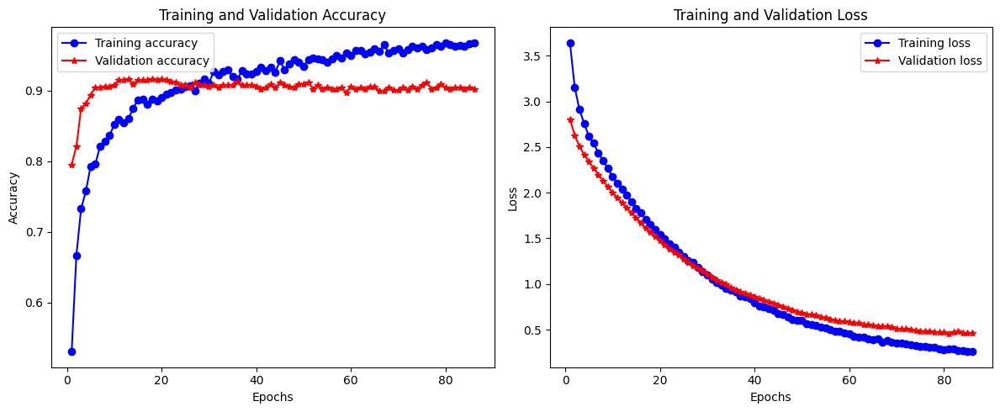

In [18]:
import matplotlib.pyplot as plt

def plot_learning_curves(history):
    # Extract accuracy and loss values from the history object
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(acc) + 1)

    # Plotting Accuracy
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'bo-', label='Training accuracy')
    plt.plot(epochs, val_acc, 'r*-', label='Validation accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plotting Loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'bo-', label='Training loss')
    plt.plot(epochs, val_loss, 'r*-', label='Validation loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Assuming you have the 'history' object from model training
plot_learning_curves(history)


36/36 ━━━━━━━━━━━━━━━━━━━━ 13s 323ms/step


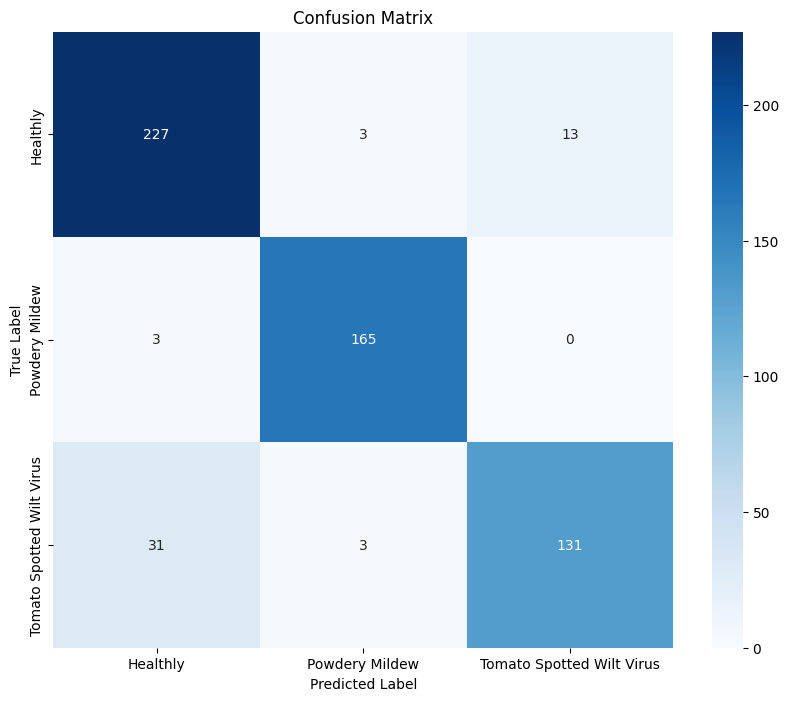

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Generate predictions for the validation dataset
y_true = np.concatenate([y.numpy() for x, y in val_ds], axis=0)  # Get true labels
y_pred_probs = model.predict(val_ds)  # Get predicted probabilities
y_pred = np.argmax(y_pred_probs, axis=1)  # Get predicted labels

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


In [20]:
from sklearn.metrics import classification_report

print(classification_report(y_true, y_pred, target_names=class_names))


                           precision    recall  f1-score   support

                 Healthly       0.87      0.93      0.90       243
           Powdery Mildew       0.96      0.98      0.97       168
Tomato Spotted Wilt Virus       0.91      0.79      0.85       165

                 accuracy                           0.91       576
                macro avg       0.91      0.90      0.91       576
             weighted avg       0.91      0.91      0.91       576



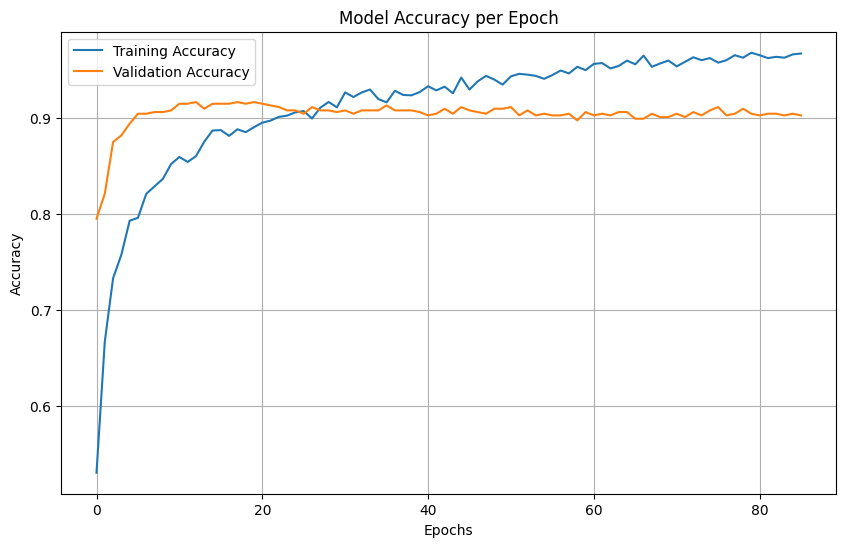

In [21]:
import matplotlib.pyplot as plt

# Check if the history variable is defined
if 'history' in locals():
    # Plot training & validation accuracy values
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy per Epoch')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()
else:
    print("The 'history' variable is not defined. Please run model.fit() first.")


36/36 ━━━━━━━━━━━━━━━━━━━━ 11s 299ms/step
36/36 ━━━━━━━━━━━━━━━━━━━━ 11s 310ms/step
36/36 ━━━━━━━━━━━━━━━━━━━━ 11s 304ms/step


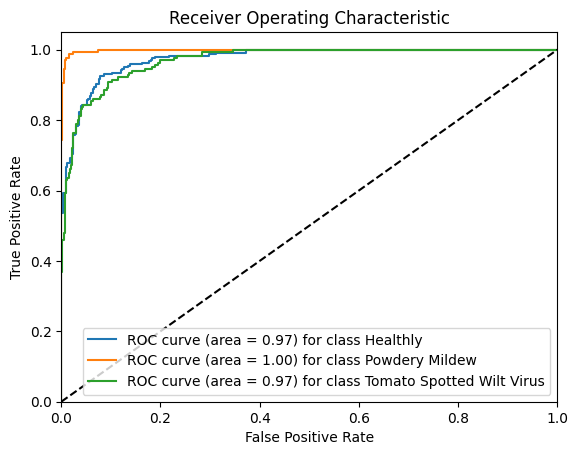

In [22]:
from sklearn.metrics import roc_curve, auc

# One-vs-Rest ROC for each class
for i in range(len(class_names)):
    y_true_binary = (y_true == i).astype(int)
    y_scores = model.predict(val_ds)[:, i]
    fpr, tpr, _ = roc_curve(y_true_binary, y_scores)
    roc_auc = auc(fpr, tpr)
    
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:.2f}) for class {class_names[i]}')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


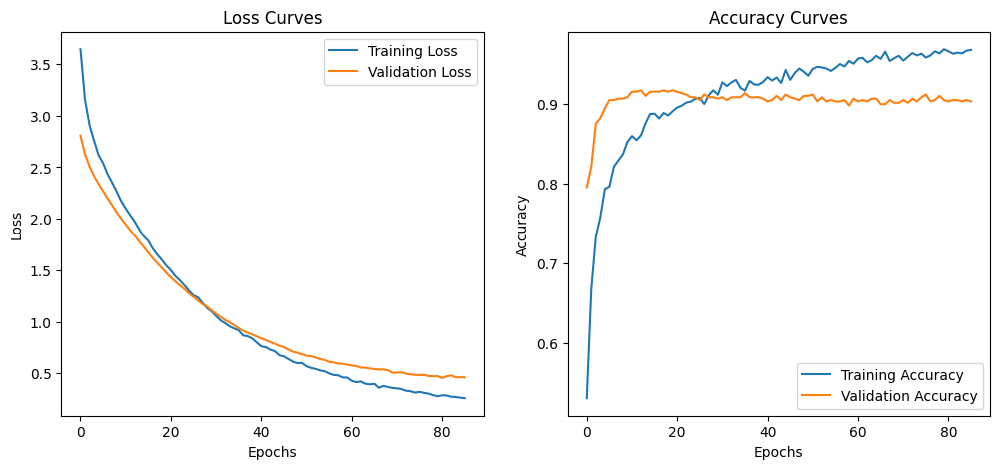

In [23]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Curves')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy Curves')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()


In [24]:
from sklearn.metrics import f1_score

f1 = f1_score(y_true, y_pred, average='weighted')
print(f'F1 Score: {f1:.2f}')


F1 Score: 0.91


In [25]:
from sklearn.metrics import matthews_corrcoef

mcc = matthews_corrcoef(y_true, y_pred)
print(f'Matthews Correlation Coefficient: {mcc:.2f}')


Matthews Correlation Coefficient: 0.86


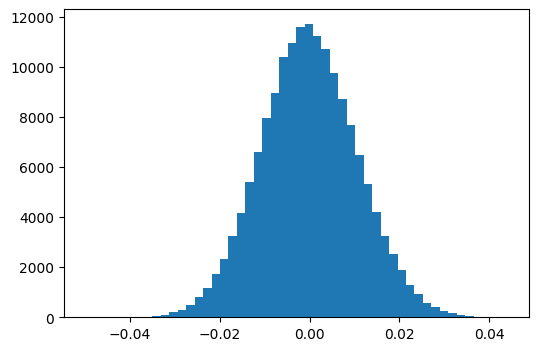

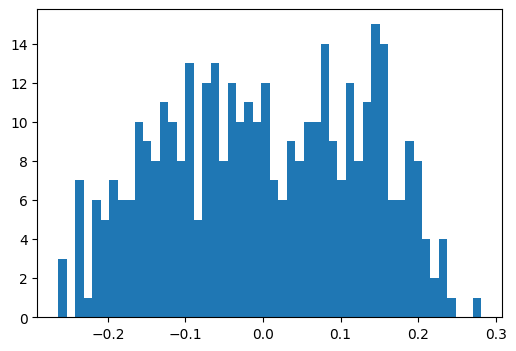

In [26]:
def plot_model_weights(model):
    for layer in model.layers:
        if hasattr(layer, 'kernel'):
            plt.figure(figsize=(6, 4))
            plt.hist(layer.kernel.numpy().flatten(), bins=50)
            plt.show()

plot_model_weights(model)


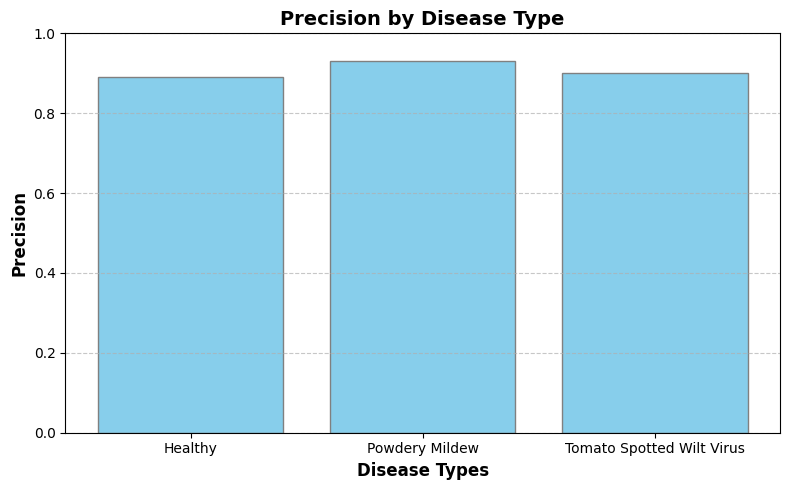

In [27]:
import matplotlib.pyplot as plt
import numpy as np

# Data for the bar chart
disease_types = ['Healthy', 'Powdery Mildew', 'Tomato Spotted Wilt Virus']
precision = [0.89, 0.93, 0.90]

# Create the bar chart
plt.figure(figsize=(8, 5))
plt.bar(disease_types, precision, color='skyblue', edgecolor='grey')

# Add labels, title, and grid
plt.xlabel('Disease Types', fontweight='bold', fontsize=12)
plt.ylabel('Precision', fontweight='bold', fontsize=12)
plt.title('Precision by Disease Type', fontweight='bold', fontsize=14)
plt.ylim(0, 1)  # Set y-axis limit to 0-1
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()


In [28]:
from sklearn.metrics import roc_auc_score

# Compute the ROC AUC score
roc_auc = roc_auc_score(y_true, model.predict(val_ds), multi_class='ovr')
print(f'ROC AUC: {roc_auc:.2f}')


36/36 ━━━━━━━━━━━━━━━━━━━━ 10s 290ms/step
ROC AUC: 0.98


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

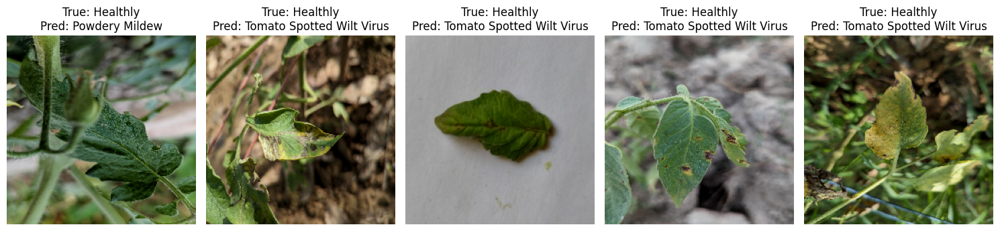

In [33]:
import numpy as np
import matplotlib.pyplot as plt

# Get misclassified samples
misclassified_images = []
misclassified_labels = []
misclassified_preds = []

for i, (x, y_true) in enumerate(val_ds):
    y_pred_probs = model.predict(x)  # Get predicted probabilities
    y_pred = np.argmax(y_pred_probs, axis=1)  # Get predicted labels
    
    # Find misclassified examples
    for j in range(len(y_true)):
        if y_pred[j] != np.argmax(y_true[j]):
            misclassified_images.append(x[j])
            misclassified_labels.append(np.argmax(y_true[j]))
            misclassified_preds.append(y_pred[j])

# Normalize images to the valid range [0, 1] for imshow
misclassified_images = [np.clip(image.numpy(), 0, 1) for image in misclassified_images]

# Plot misclassified images in a row-wise layout
num_misclassified = 5  # Number of misclassified images to display
plt.figure(figsize=(15, 5))  # Adjust the figure size for row display

# Create subplots in row order (1 row, num_misclassified columns)
for i in range(num_misclassified):
    plt.subplot(1, num_misclassified, i+1)  # Row-wise display
    plt.imshow(misclassified_images[i])  # Display the image
    true_label = class_names[misclassified_labels[i]]
    pred_label = class_names[misclassified_preds[i]]
    plt.title(f'True: {true_label}\nPred: {pred_label}')
    plt.axis('off')

plt.tight_layout()
plt.show()


In [35]:
from sklearn.metrics import matthews_corrcoef

mcc = matthews_corrcoef(y_true, y_pred)
print(f'Matthews Correlation Coefficient: {mcc:.2f}')


Matthews Correlation Coefficient: 0.91


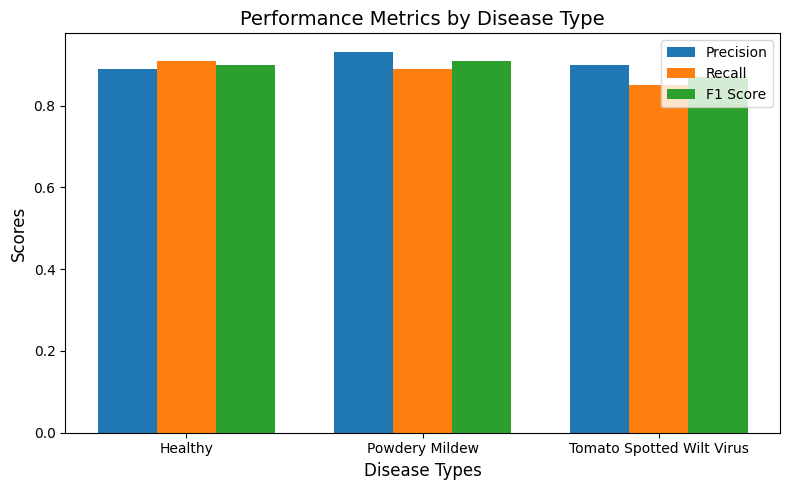

In [42]:
import numpy as np
import matplotlib.pyplot as plt

# Sample data
disease_types = ['Healthy', 'Powdery Mildew', 'Tomato Spotted Wilt Virus']
precision = [0.89, 0.93, 0.90]
recall = [0.91, 0.89, 0.85]
f1_scores = [0.90, 0.91, 0.87]

# Create the bar chart
fig, ax = plt.subplots(figsize=(8, 5))
bar_width = 0.25  # Adjusted to give more space between the bars
index = np.arange(len(disease_types))

# Create the bars with slightly adjusted positions to avoid overlapping
ax.bar(index, precision, bar_width, label='Precision')
ax.bar(index + bar_width, recall, bar_width, label='Recall')
ax.bar(index + 2*bar_width, f1_scores, bar_width, label='F1 Score')

# Set labels and title
ax.set_xlabel('Disease Types', fontsize=12)
ax.set_ylabel('Scores', fontsize=12)
ax.set_title('Performance Metrics by Disease Type', fontsize=14)

# Adjust x-ticks to avoid overlap and position them at the center of the grouped bars
ax.set_xticks(index + bar_width)  
ax.set_xticklabels(disease_types)

# Add legend
ax.legend()

# Tighten layout to ensure everything fits without overlap
plt.tight_layout()
plt.show()


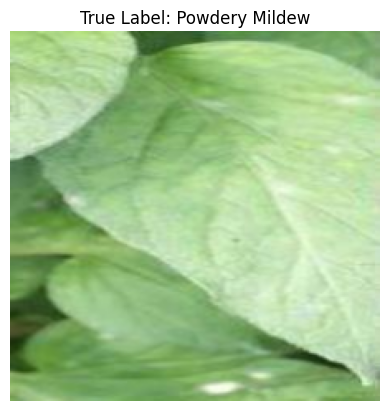

Image batch shape: (16, 224, 224, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step
Prediction shape: (16, 3)
Predicted label for the selected image: Powdery Mildew


In [49]:
import numpy as np
import matplotlib.pyplot as plt

# Making random predictions
for images_batch, label_batch in test_ds.take(1):
    # Randomly select an image from the batch
    random_index = np.random.choice(images_batch.shape[0])  # Random index in the batch
    image1 = images_batch[random_index].numpy()  # Get the selected image
    label1 = label_batch[random_index].numpy()  # Get the true label for that image

    # If the image values are normalized between 0 and 1, convert them to [0, 255] range
    if image1.max() <= 1.0:  # Checking if the image is normalized
        image1 = (image1 * 255).astype('uint8')

    # Display the selected image and its true label
    plt.imshow(image1)
    plt.title(f"True Label: {class_names[label1]}")
    plt.axis('off')  # Hide the axis for better visualization
    plt.show()

    # Print the shape of the batch
    print("Image batch shape:", images_batch.shape)

    # Predict using the model for the selected image
    batch_prediction = model.predict(images_batch)
    print("Prediction shape:", batch_prediction.shape)

    # Get the predicted label for the selected image
    predicted_label = np.argmax(batch_prediction[random_index])

    # Print the predicted label
    print(f"Predicted label for the selected image: {class_names[predicted_label]}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


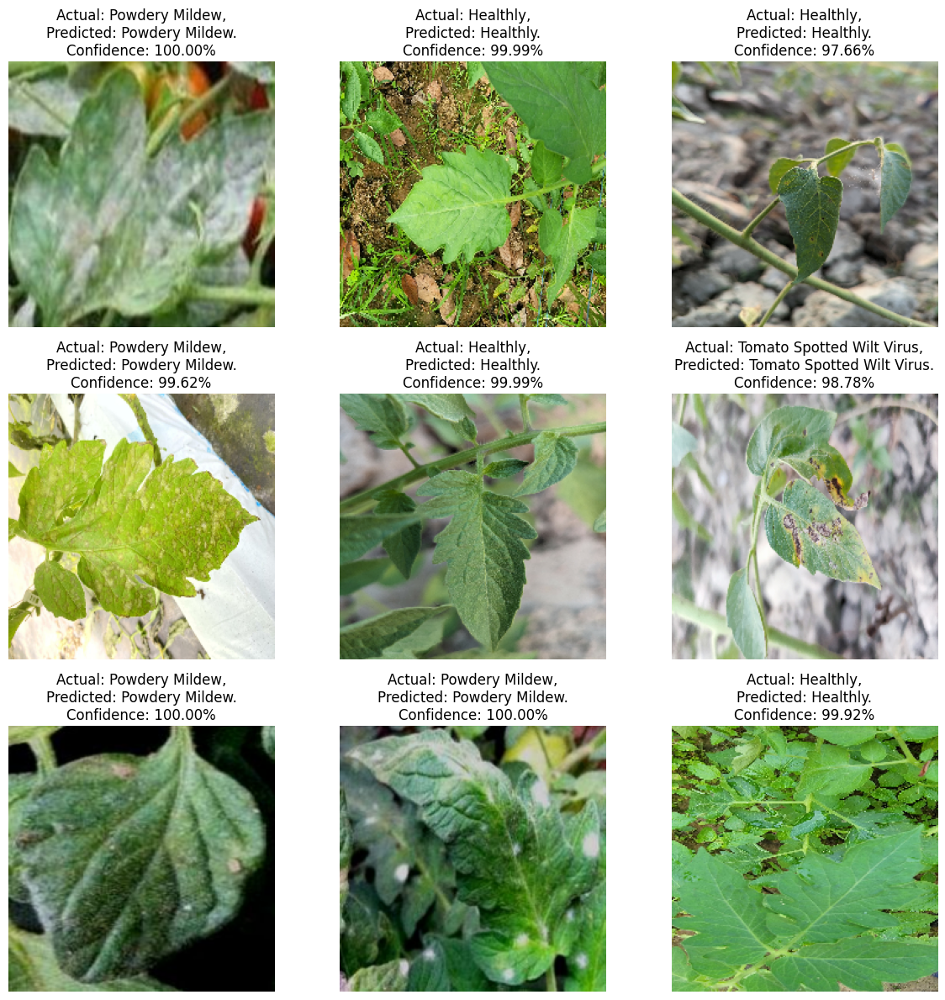

In [55]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Function to predict with confidence
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(img)  # Convert image to array
    img_array = tf.expand_dims(img_array, 0)  # Add batch dimension
    
    predictions = model.predict(img_array)  # Make predictions
    predicted_class = class_names[np.argmax(predictions[0])]  # Get predicted class
    confidence = 100 * np.max(predictions[0])  # Calculate confidence
    confidence = f"{confidence:.2f}"  # Format confidence to 2 decimal places
    
    return predicted_class, confidence

# Plotting 9 random predictions from the dataset
plt.figure(figsize=(12, 12))  # Adjust figsize to reduce the image box size
for images, labels in test_ds.take(1):  # Take one batch from test_ds
    # Generate 9 random indices
    random_indices = np.random.choice(images.shape[0], 9, replace=False)
    
    for i, random_index in enumerate(random_indices):
        ax = plt.subplot(3, 3, i+1)  # Create a 3x3 grid for the images
        image = images[random_index].numpy()
        label = labels[random_index].numpy()

        # Make prediction for the selected image
        predicted_class, confidence = predict(model, image)
        actual_class = class_names[label]

        # Normalize the image for visualization (clip values to [0, 255] and convert to uint8)
        image = np.clip(image * 255, 0, 255).astype('uint8')

        # Display the image with the predicted and actual class labels and confidence
        plt.imshow(image)
        plt.title(f"Actual: {actual_class},\nPredicted: {predicted_class}.\nConfidence: {confidence}%")
        plt.axis("off")

plt.tight_layout()
plt.show()


In [57]:
import tensorflow as tf
import os
from tensorflow.keras import layers
import numpy as np
from PIL import Image

# Define the dataset path and output path for preprocessed images
dataset_path = r"C:\Users\sakib\Downloads\CNN_Model_V2\Dataset"
preprocessed_output_path = r"C:\Users\sakib\Downloads\Tomato\Preprocessed_Dataset"

# Create output directory if it doesn't exist
if not os.path.exists(preprocessed_output_path):
    os.makedirs(preprocessed_output_path)

# Define image preprocessing function
def preprocess_and_save_image(image_path, output_path, image_size=(224, 224)):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.resize(img, image_size)
    img = img / 255.0  # Rescale to [0, 1]
    img = tf.image.convert_image_dtype(img, dtype=tf.uint8)  # Convert back to uint8 format

    # Convert image tensor to numpy array and save
    img_array = img.numpy()
    pil_img = Image.fromarray(img_array)
    pil_img.save(output_path)

# Function to process the full dataset
def preprocess_full_dataset(dataset_path, output_path):
    class_names = sorted(os.listdir(dataset_path))
    for class_name in class_names:
        class_folder = os.path.join(dataset_path, class_name)
        output_class_folder = os.path.join(output_path, class_name)
        
        # Create subfolder in the output directory
        if not os.path.exists(output_class_folder):
            os.makedirs(output_class_folder)

        # Process each image in the class folder
        for image_name in os.listdir(class_folder):
            image_path = os.path.join(class_folder, image_name)
            output_image_path = os.path.join(output_class_folder, image_name)

            # Preprocess and save image
            preprocess_and_save_image(image_path, output_image_path)
            print(f"Preprocessed and saved {image_name} to {output_image_path}")

# Preprocess the full dataset
preprocess_full_dataset(dataset_path, preprocessed_output_path)
print("All images have been preprocessed and saved.")


Preprocessed and saved 20231212_124843.jpg to C:\Users\sakib\Downloads\Tomato\Preprocessed_Dataset\Healthly\20231212_124843.jpg
Preprocessed and saved 20231212_124856.jpg to C:\Users\sakib\Downloads\Tomato\Preprocessed_Dataset\Healthly\20231212_124856.jpg
Preprocessed and saved 20231212_124913.jpg to C:\Users\sakib\Downloads\Tomato\Preprocessed_Dataset\Healthly\20231212_124913.jpg
Preprocessed and saved 20231212_124914.jpg to C:\Users\sakib\Downloads\Tomato\Preprocessed_Dataset\Healthly\20231212_124914.jpg
Preprocessed and saved 20231212_124920.jpg to C:\Users\sakib\Downloads\Tomato\Preprocessed_Dataset\Healthly\20231212_124920.jpg
Preprocessed and saved 20231212_124931.jpg to C:\Users\sakib\Downloads\Tomato\Preprocessed_Dataset\Healthly\20231212_124931.jpg
Preprocessed and saved 20231212_124933.jpg to C:\Users\sakib\Downloads\Tomato\Preprocessed_Dataset\Healthly\20231212_124933.jpg
Preprocessed and saved 20231212_124943.jpg to C:\Users\sakib\Downloads\Tomato\Preprocessed_Dataset\Healt

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


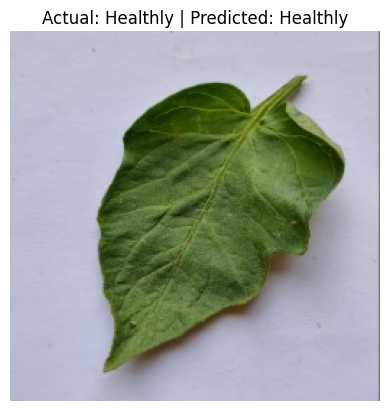

Actual class: Healthly, Predicted class: Healthly


In [58]:
import random
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import os

# Path to the dataset folder
dataset_path = r"C:\Users\sakib\Downloads\CNN_Model_V2\Dataset"

# Get class names from the dataset
def get_class_names(dataset_path):
    return sorted(os.listdir(dataset_path))

class_names = get_class_names(dataset_path)

# Function to get a random image path and its actual class from the dataset
def get_random_image_path_and_class(dataset_path):
    class_folders = [os.path.join(dataset_path, class_folder) for class_folder in os.listdir(dataset_path)]
    random_class_folder = random.choice(class_folders)
    random_image = random.choice(os.listdir(random_class_folder))
    actual_class = os.path.basename(random_class_folder)
    return os.path.join(random_class_folder, random_image), actual_class

# Function to preprocess a single image for prediction
def preprocess_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.resize(img, [224, 224])
    img = img / 255.0
    return img

# Function to predict the class of a random image and display results
def predict_and_display_random_image(model):
    image_path, actual_class = get_random_image_path_and_class(dataset_path)  # Get a random image and its actual class
    processed_image = preprocess_image(image_path)
    processed_image = tf.expand_dims(processed_image, axis=0)  # Add batch dimension
    predictions = model.predict(processed_image)
    predicted_class_index = np.argmax(predictions)
    predicted_class = class_names[predicted_class_index]

    # Display the image with actual and predicted class labels
    img = plt.imread(image_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Actual: {actual_class} | Predicted: {predicted_class}")
    plt.show()

    return actual_class, predicted_class

# Example usage: predict and display a random image
actual_class, predicted_class = predict_and_display_random_image(model)
print(f"Actual class: {actual_class}, Predicted class: {predicted_class}")


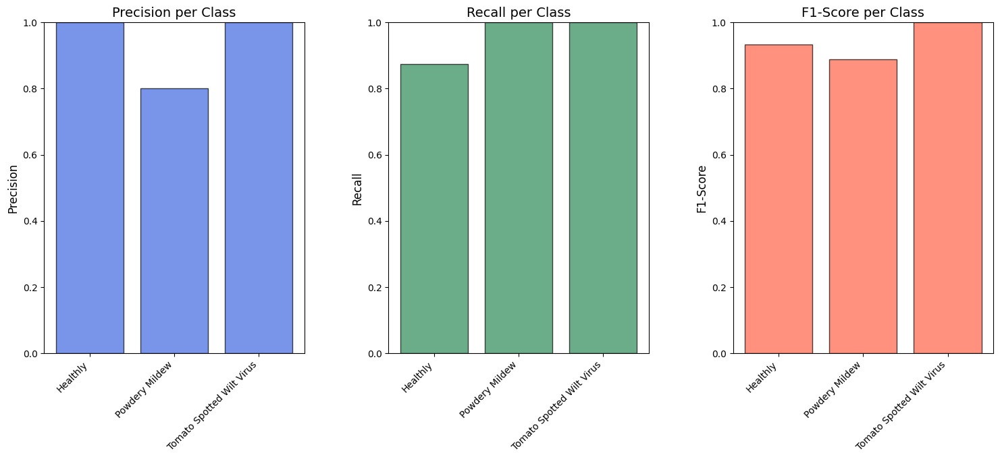

In [62]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import classification_report

# Assuming y_true, y_pred, and class_names are already defined

# Generate the classification report
report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)

# Precision, Recall, F1-Score for each class
precision = [report[class_name]['precision'] for class_name in class_names]
recall = [report[class_name]['recall'] for class_name in class_names]
f1_score = [report[class_name]['f1-score'] for class_name in class_names]

x = np.arange(len(class_names))  # the class labels

# Plot
plt.figure(figsize=(16, 8))

# Precision Plot
plt.subplot(1, 3, 1)
plt.bar(x, precision, color='royalblue', edgecolor='black', alpha=0.7)
plt.xticks(x, class_names, rotation=45, ha='right', fontsize=10)
plt.ylabel('Precision', fontsize=12)
plt.title('Precision per Class', fontsize=14)
plt.ylim(0, 1)  # Keep the y-axis consistent

# Recall Plot
plt.subplot(1, 3, 2)
plt.bar(x, recall, color='seagreen', edgecolor='black', alpha=0.7)
plt.xticks(x, class_names, rotation=45, ha='right', fontsize=10)
plt.ylabel('Recall', fontsize=12)
plt.title('Recall per Class', fontsize=14)
plt.ylim(0, 1)

# F1-Score Plot
plt.subplot(1, 3, 3)
plt.bar(x, f1_score, color='tomato', edgecolor='black', alpha=0.7)
plt.xticks(x, class_names, rotation=45, ha='right', fontsize=10)
plt.ylabel('F1-Score', fontsize=12)
plt.title('F1-Score per Class', fontsize=14)
plt.ylim(0, 1)

# Adjust layout and spacing
plt.tight_layout(pad=5.0)

# Show the plot
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━

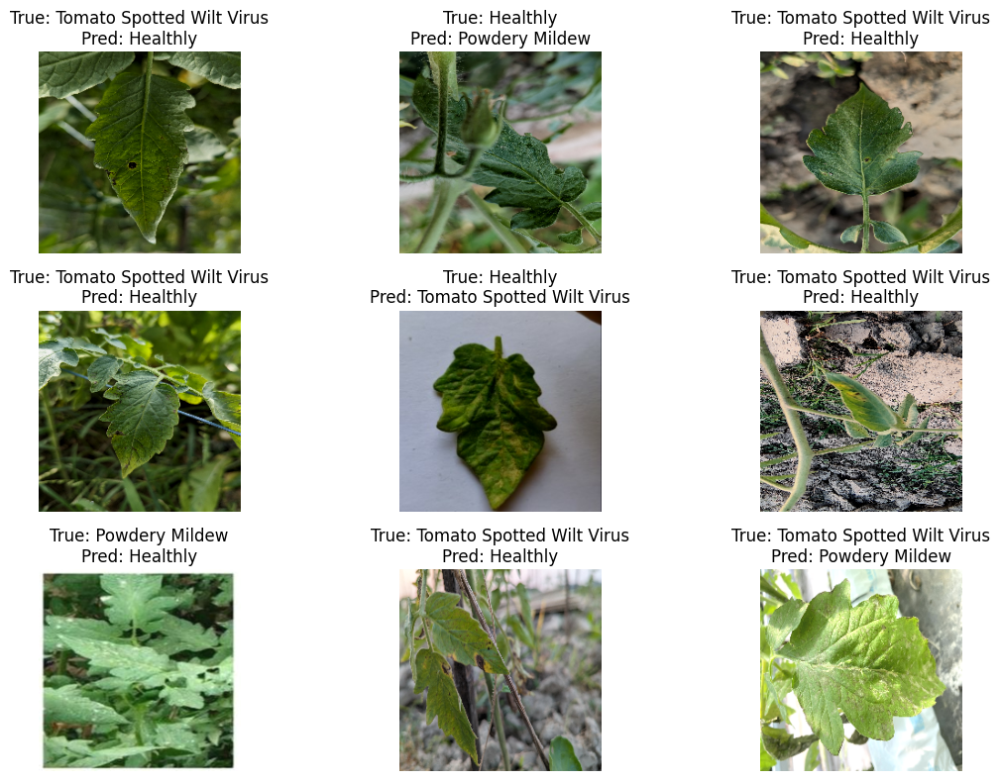

In [69]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming y_true, y_pred, class_names, and val_ds (dataset) are already defined

# Get the misclassified indices
misclassified_indices = np.where(y_true != y_pred)[0]

# Create a list to store the misclassified images and labels
misclassified_images = []
misclassified_true_labels = []
misclassified_pred_labels = []

# Iterate through the dataset and collect misclassified images
misclassified_count = 0
for images, labels in val_ds:
    batch_size = images.shape[0]
    
    for i in range(batch_size):
        # Predict the label for the current image
        image = images[i].numpy()
        true_label = labels[i].numpy()
        predicted_label = np.argmax(model.predict(image[np.newaxis]))  # Model prediction

        # Check if the image is misclassified
        if true_label != predicted_label and misclassified_count < 9:
            misclassified_images.append(image)
            misclassified_true_labels.append(class_names[true_label])
            misclassified_pred_labels.append(class_names[predicted_label])
            misclassified_count += 1

    if misclassified_count >= 9:
        break  # Stop after collecting 9 misclassified images

# Visualize misclassified images
plt.figure(figsize=(12, 8))
for i in range(len(misclassified_images)):  # Display up to 9 misclassified images
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(misclassified_images[i])
    plt.title(f"True: {misclassified_true_labels[i]}\nPred: {misclassified_pred_labels[i]}")
    plt.axis('off')

plt.tight_layout()
plt.show()


In [98]:
# Save the model
model.save('best_model_saved.keras')  # Save your model

print(f'Model saved as best_model_saved.keras')

Model saved as best_model_saved.keras


C:\Users\sakib\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
  0%|                                                                                         | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 601ms/step


  1%|▊                                                                               | 10/1000 [00:00<01:08, 14.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


  2%|█▌                                                                              | 20/1000 [00:01<00:48, 20.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  3%|██▍                                                                             | 30/1000 [00:01<00:40, 24.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


  4%|███▏                                                                            | 40/1000 [00:01<00:36, 26.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


  5%|████                                                                            | 50/1000 [00:02<00:33, 27.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


  6%|████▊                                                                           | 60/1000 [00:02<00:31, 29.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


  7%|█████▌                                                                          | 70/1000 [00:02<00:31, 29.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


  8%|██████▍                                                                         | 80/1000 [00:02<00:29, 30.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


  9%|███████▏                                                                        | 90/1000 [00:03<00:29, 30.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 10%|███████▉                                                                       | 100/1000 [00:03<00:29, 30.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 11%|████████▋                                                                      | 110/1000 [00:03<00:27, 31.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 12%|█████████▍                                                                     | 120/1000 [00:04<00:27, 32.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 13%|██████████▎                                                                    | 130/1000 [00:04<00:26, 33.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 14%|███████████                                                                    | 140/1000 [00:04<00:27, 31.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 15%|███████████▊                                                                   | 150/1000 [00:05<00:26, 32.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 16%|████████████▋                                                                  | 160/1000 [00:05<00:25, 32.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 17%|█████████████▍                                                                 | 170/1000 [00:05<00:24, 33.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 18%|██████████████▏                                                                | 180/1000 [00:06<00:24, 32.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 19%|███████████████                                                                | 190/1000 [00:06<00:24, 33.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 20%|███████████████▊                                                               | 200/1000 [00:06<00:24, 32.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 21%|████████████████▌                                                              | 210/1000 [00:06<00:24, 32.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


 22%|█████████████████▍                                                             | 220/1000 [00:07<00:27, 28.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 23%|██████████████████▏                                                            | 230/1000 [00:07<00:27, 28.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 24%|██████████████████▉                                                            | 240/1000 [00:08<00:26, 28.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 25%|███████████████████▊                                                           | 250/1000 [00:08<00:24, 30.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 26%|████████████████████▌                                                          | 260/1000 [00:08<00:23, 30.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 27%|█████████████████████▎                                                         | 270/1000 [00:08<00:22, 31.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 28%|██████████████████████                                                         | 280/1000 [00:09<00:22, 32.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 29%|██████████████████████▉                                                        | 290/1000 [00:09<00:21, 32.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 30%|███████████████████████▋                                                       | 300/1000 [00:09<00:21, 33.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 31%|████████████████████████▍                                                      | 310/1000 [00:10<00:21, 32.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


 32%|█████████████████████████▎                                                     | 320/1000 [00:10<00:22, 30.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 33%|██████████████████████████                                                     | 330/1000 [00:10<00:22, 30.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 34%|██████████████████████████▊                                                    | 340/1000 [00:11<00:21, 31.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 35%|███████████████████████████▋                                                   | 350/1000 [00:11<00:20, 31.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 36%|████████████████████████████▍                                                  | 360/1000 [00:11<00:19, 32.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 37%|█████████████████████████████▏                                                 | 370/1000 [00:12<00:19, 32.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


 38%|██████████████████████████████                                                 | 380/1000 [00:12<00:20, 30.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


 39%|██████████████████████████████▊                                                | 390/1000 [00:12<00:21, 28.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


 40%|███████████████████████████████▌                                               | 400/1000 [00:13<00:21, 28.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 41%|████████████████████████████████▍                                              | 410/1000 [00:13<00:20, 29.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 42%|█████████████████████████████████▏                                             | 420/1000 [00:13<00:19, 30.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


 43%|█████████████████████████████████▉                                             | 430/1000 [00:14<00:19, 29.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 44%|██████████████████████████████████▊                                            | 440/1000 [00:14<00:19, 29.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 45%|███████████████████████████████████▌                                           | 450/1000 [00:14<00:18, 29.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 46%|████████████████████████████████████▎                                          | 460/1000 [00:15<00:22, 23.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 47%|█████████████████████████████████████▏                                         | 470/1000 [00:15<00:21, 24.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


 48%|█████████████████████████████████████▉                                         | 480/1000 [00:16<00:20, 24.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


 49%|██████████████████████████████████████▋                                        | 490/1000 [00:16<00:20, 25.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


 50%|███████████████████████████████████████▌                                       | 500/1000 [00:17<00:19, 25.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


 51%|████████████████████████████████████████▎                                      | 510/1000 [00:17<00:19, 25.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


 52%|█████████████████████████████████████████                                      | 520/1000 [00:17<00:17, 27.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 53%|█████████████████████████████████████████▊                                     | 530/1000 [00:18<00:16, 28.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 54%|██████████████████████████████████████████▋                                    | 540/1000 [00:18<00:15, 29.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


 55%|███████████████████████████████████████████▍                                   | 550/1000 [00:18<00:15, 29.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 56%|████████████████████████████████████████████▏                                  | 560/1000 [00:18<00:14, 30.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


 57%|█████████████████████████████████████████████                                  | 570/1000 [00:19<00:15, 28.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 58%|█████████████████████████████████████████████▊                                 | 580/1000 [00:19<00:14, 29.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


 59%|██████████████████████████████████████████████▌                                | 590/1000 [00:20<00:13, 29.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


 60%|███████████████████████████████████████████████▍                               | 600/1000 [00:20<00:13, 28.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 61%|████████████████████████████████████████████████▏                              | 610/1000 [00:20<00:14, 27.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


 62%|████████████████████████████████████████████████▉                              | 620/1000 [00:21<00:13, 27.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 63%|█████████████████████████████████████████████████▊                             | 630/1000 [00:21<00:13, 27.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


 64%|██████████████████████████████████████████████████▌                            | 640/1000 [00:21<00:13, 26.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


 65%|███████████████████████████████████████████████████▎                           | 650/1000 [00:22<00:13, 26.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


 66%|████████████████████████████████████████████████████▏                          | 660/1000 [00:22<00:12, 27.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


 67%|████████████████████████████████████████████████████▉                          | 670/1000 [00:23<00:11, 27.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


 68%|█████████████████████████████████████████████████████▋                         | 680/1000 [00:23<00:11, 28.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


 69%|██████████████████████████████████████████████████████▌                        | 690/1000 [00:23<00:10, 28.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 70%|███████████████████████████████████████████████████████▎                       | 700/1000 [00:24<00:10, 28.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 71%|████████████████████████████████████████████████████████                       | 710/1000 [00:24<00:09, 29.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


 72%|████████████████████████████████████████████████████████▉                      | 720/1000 [00:24<00:09, 29.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


 73%|█████████████████████████████████████████████████████████▋                     | 730/1000 [00:24<00:08, 30.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 74%|██████████████████████████████████████████████████████████▍                    | 740/1000 [00:25<00:08, 30.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


 75%|███████████████████████████████████████████████████████████▎                   | 750/1000 [00:25<00:08, 31.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 76%|████████████████████████████████████████████████████████████                   | 760/1000 [00:25<00:07, 31.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 77%|████████████████████████████████████████████████████████████▊                  | 770/1000 [00:26<00:07, 30.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


 78%|█████████████████████████████████████████████████████████████▌                 | 780/1000 [00:26<00:07, 30.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 79%|██████████████████████████████████████████████████████████████▍                | 790/1000 [00:26<00:06, 31.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


 80%|███████████████████████████████████████████████████████████████▏               | 800/1000 [00:27<00:06, 30.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 81%|███████████████████████████████████████████████████████████████▉               | 810/1000 [00:27<00:05, 31.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 82%|████████████████████████████████████████████████████████████████▊              | 820/1000 [00:27<00:05, 32.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 83%|█████████████████████████████████████████████████████████████████▌             | 830/1000 [00:28<00:05, 32.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 84%|██████████████████████████████████████████████████████████████████▎            | 840/1000 [00:28<00:04, 32.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


 85%|███████████████████████████████████████████████████████████████████▏           | 850/1000 [00:28<00:04, 32.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


 86%|███████████████████████████████████████████████████████████████████▉           | 860/1000 [00:29<00:04, 32.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


 87%|████████████████████████████████████████████████████████████████████▋          | 870/1000 [00:29<00:03, 32.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


 88%|█████████████████████████████████████████████████████████████████████▌         | 880/1000 [00:29<00:03, 32.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 89%|██████████████████████████████████████████████████████████████████████▎        | 890/1000 [00:29<00:03, 31.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 90%|███████████████████████████████████████████████████████████████████████        | 900/1000 [00:30<00:03, 31.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 91%|███████████████████████████████████████████████████████████████████████▉       | 910/1000 [00:30<00:02, 31.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


 92%|████████████████████████████████████████████████████████████████████████▋      | 920/1000 [00:30<00:02, 32.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


 93%|█████████████████████████████████████████████████████████████████████████▍     | 930/1000 [00:31<00:02, 31.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


 94%|██████████████████████████████████████████████████████████████████████████▎    | 940/1000 [00:31<00:01, 32.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


 95%|███████████████████████████████████████████████████████████████████████████    | 950/1000 [00:31<00:01, 31.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 96%|███████████████████████████████████████████████████████████████████████████▊   | 960/1000 [00:32<00:01, 32.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 97%|████████████████████████████████████████████████████████████████████████████▋  | 970/1000 [00:32<00:00, 31.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 98%|█████████████████████████████████████████████████████████████████████████████▍ | 980/1000 [00:32<00:00, 32.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▏| 990/1000 [00:33<00:00, 31.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step



00%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:33<00:00, 29.86it/s]

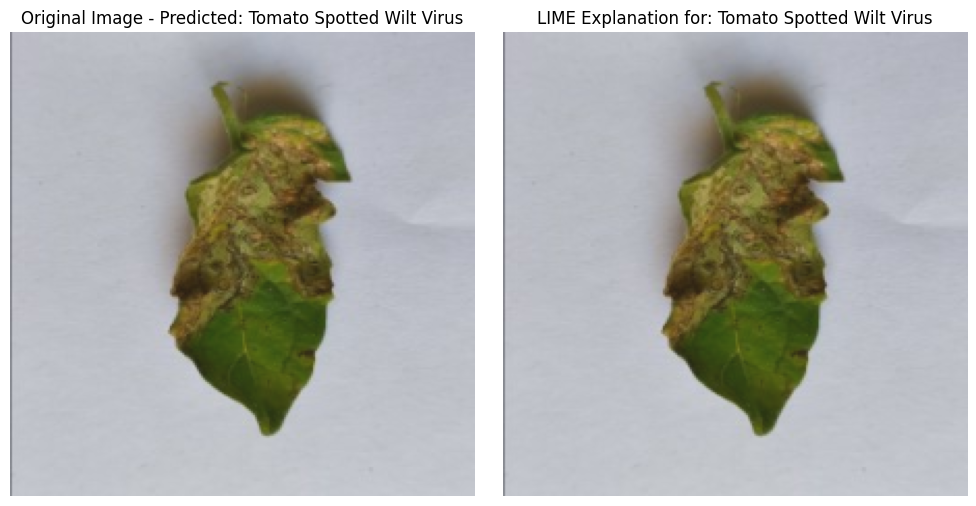

In [72]:
import lime
import lime.lime_image
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'model' is your trained model, and 'image' is the image for explanation
# Also assuming you have the 'class_names' variable defined.

# Initialize the LIME explainer
explainer = lime.lime_image.LimeImageExplainer()

# Explain the image - replace 'image' with the actual image you want to explain
explanation = explainer.explain_instance(image, model.predict, top_labels=5, hide_color=0, num_samples=1000)

# Get the top label
top_label = explanation.top_labels[0]

# Visualize the explanation for the top label
temp, mask = explanation.get_image_and_mask(
    top_label,
    positive_only=True,
    hide_rest=False,
    min_weight=0.05
)

# Display the original image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title(f"Original Image - Predicted: {class_names[top_label]}")
plt.axis('off')

# Display the masked explanation
plt.subplot(1, 2, 2)
plt.imshow(temp)
plt.title(f"LIME Explanation for: {class_names[top_label]}")
plt.axis('off')

plt.tight_layout()
plt.show()


In [85]:
# Save the model in the new Keras format
model.save('Final_trained_model.keras')  # Save the model as a .keras file
